### Laboratorium 6 - część projektowa

W tej części zajmiesz się wykorzystaniem punktów kluczowych do łączenia obrazów (_image stitching_). Celem zadania jest przetestowanie możliwości detekcji i parowania punktów kluczowych w celu łączenia obrazów. Istotne jest, by samodzielnie przejść całą ścieżkę: od detekcji punktów kluczowych i wyznaczenia ich desktryptorów, przez ich parowanie i znalezienie transformacji, po finalne połączenie obrazów. Rozwiązania oparte o gotowce w stylu black-box nie będą oceniane.

Wykonaj serię zdjęć dowolnej wybranej przez siebie **statycznej** sceny. Może to być niemal dowolny widok o dowolnej skali: panorama miasta, swojego pokoju, powierzchni biurka - ważne, by pozyskane obrazy umożliwiały (1) użycie algorytmu SIFT, oraz (2) wykonanie transformacji geometrycznej.

Wykonaj 4-5 zdjęć, spośród których pierwsze (nazwij je `base`) niech przedstawia \"główny\" widok sceny, a pozostałe (o nazwie `offset_{index}`) niech cechują się coraz większym przesunięciem kamery względem `base`. Proponowane różnice:
* nieznaczne przesunięcie (o ~połowę szerokości klatki),
* większe przesunięcie (o 3/4 szerokości lub więcej),
* przesunięcie z rotacją w osi kamery,
* (jeśli to możliwe) przybliżenie/oddalenie kamery.

Wykorzystaj algorytmy opracowane do realizacji zadania 3 (zwłaszcza 3b) w celu przekształcania obrazów `offset_x` do geometrii `base`. Upewnij się, że wymiary wynikowych obrazów są wystarczające do zmieszczenia obu składowych.

*Czy każdą parę `offset_i`-`base` udało się połączyć? Jeśli dla którejś pary metoda zawiodła, to dlaczego?*  
*Jaka była jakość dopasowania? Na jakiej podstawie ją określasz?*

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

In [17]:
folder = 'bociany'

In [18]:
# Load the images
base = cv2.imread(os.path.join(folder, 'base.jpg'))
offset_images = [
    cv2.imread(os.path.join(folder, 'offset_0.jpg')),
    cv2.imread(os.path.join(folder, 'offset_1.jpg')),
    cv2.imread(os.path.join(folder, 'offset_2.jpg')),
    cv2.imread(os.path.join(folder, 'offset_3.jpg'))
]

In [19]:
sift = cv2.SIFT_create()

In [20]:
kp_base, des_base = sift.detectAndCompute(base, None)

In [21]:
def process_offset_image(offset_img, base_img, kp_base, des_base):
    # Detect keypoints and descriptors for the offset image
    kp_offset, des_offset = sift.detectAndCompute(offset_img, None)

    # Match descriptors using BFMatcher
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(des_base, des_offset)

    # Sort matches by distance and filter
    matches = sorted(matches, key=lambda x: x.distance)
    threshold = 200
    filtered_matches = [m for m in matches if m.distance < threshold]

    # Extract matched points
    dst_pts = np.float32([kp_base[m.queryIdx].pt for m in filtered_matches]).reshape(-1, 1, 2)
    src_pts = np.float32([kp_offset[m.trainIdx].pt for m in filtered_matches]).reshape(-1, 1, 2)

    # Find homography using RANSAC
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Warp the offset image to align with the base image
    h, w, _ = base_img.shape
    aligned_img = cv2.warpPerspective(offset_img, M, (w, h))

    return aligned_img, kp_offset, filtered_matches, mask


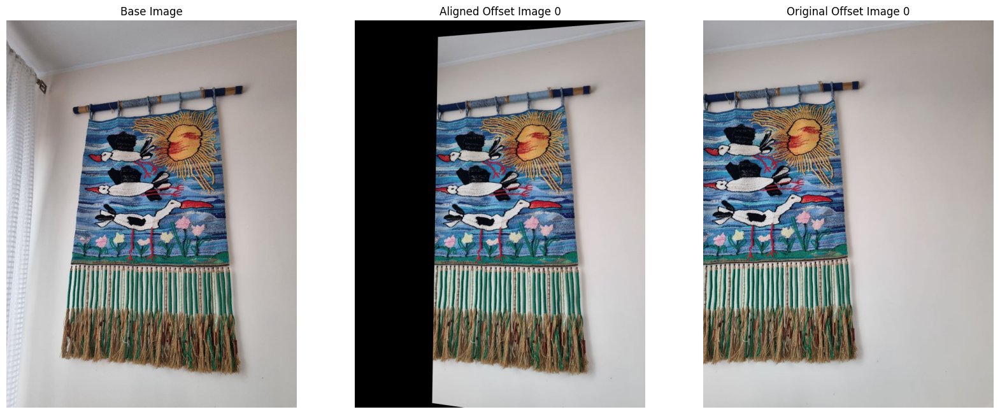

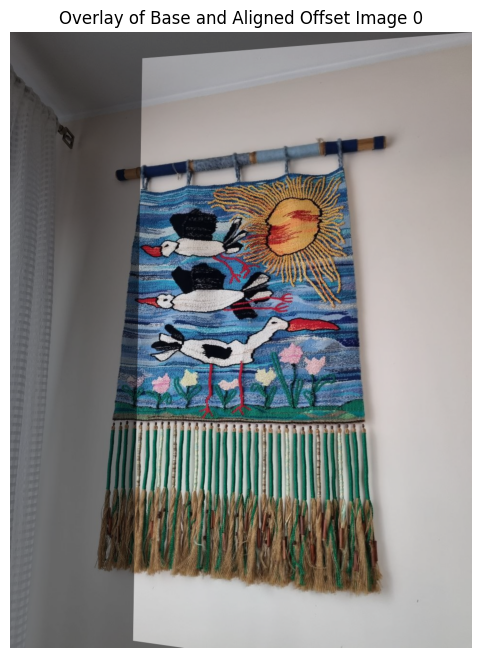

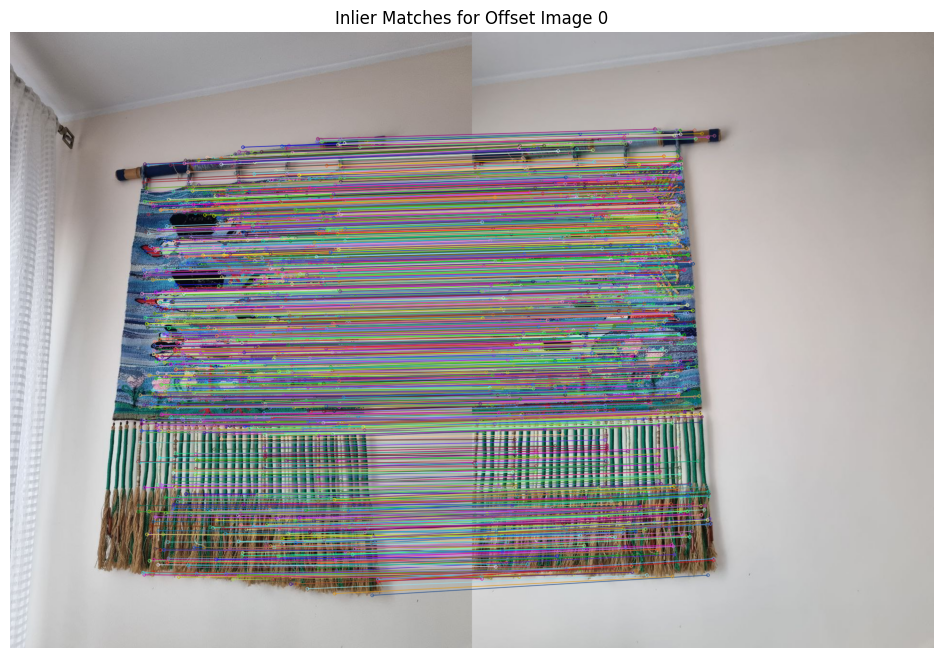

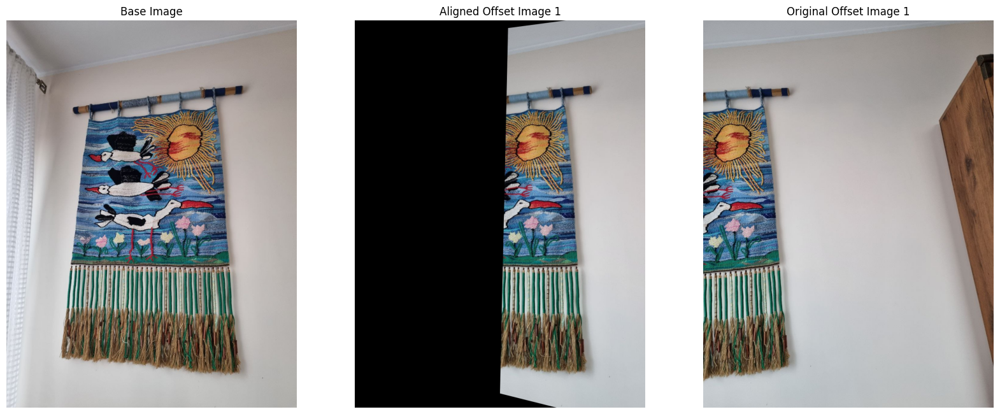

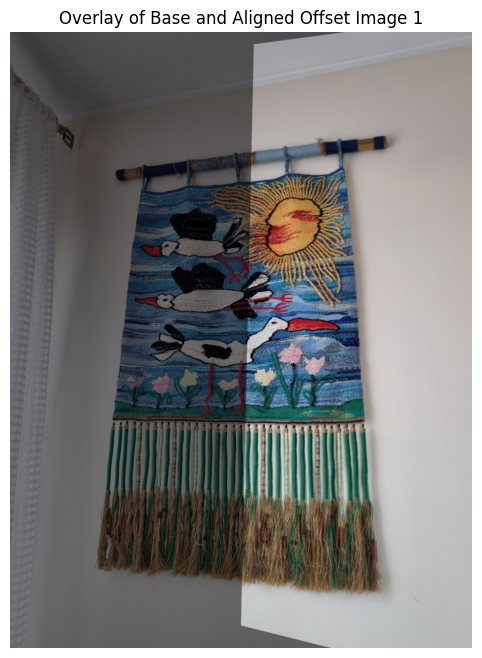

...

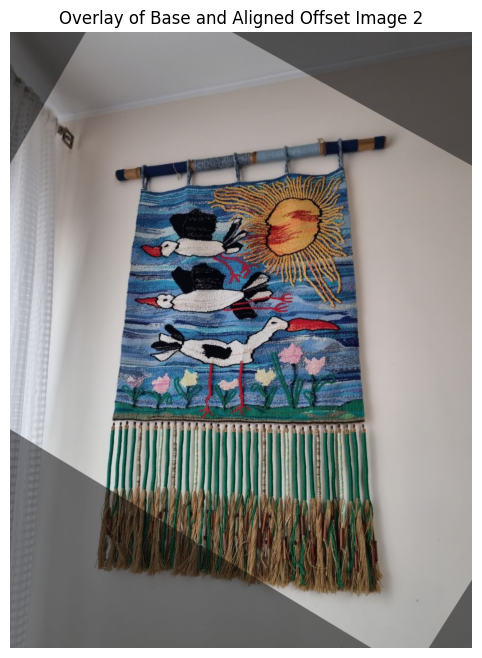

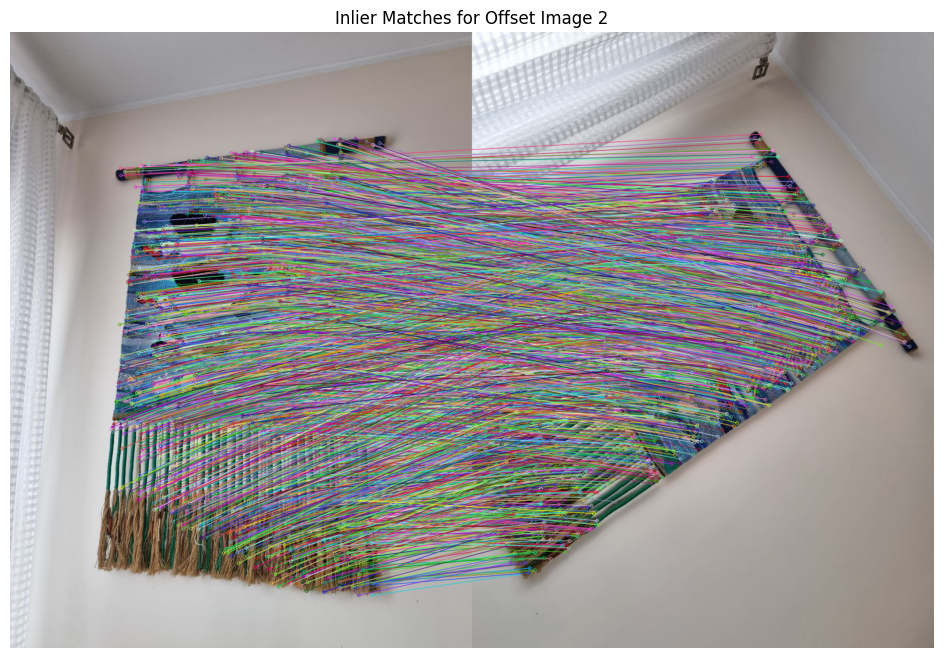

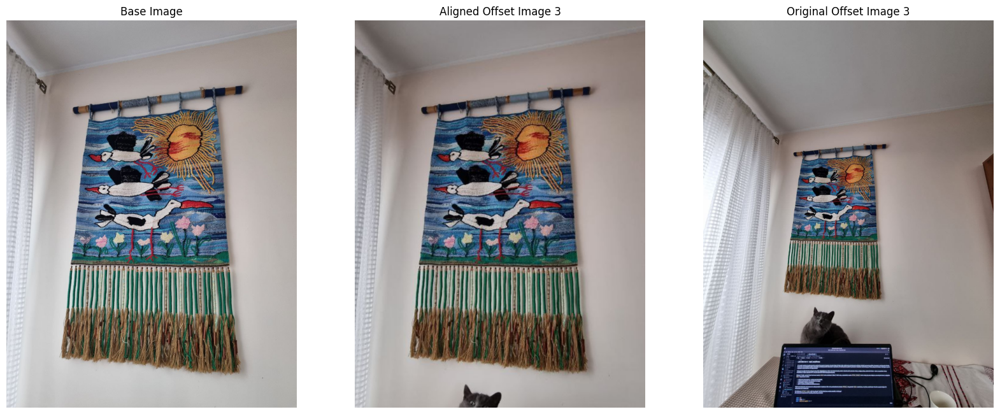

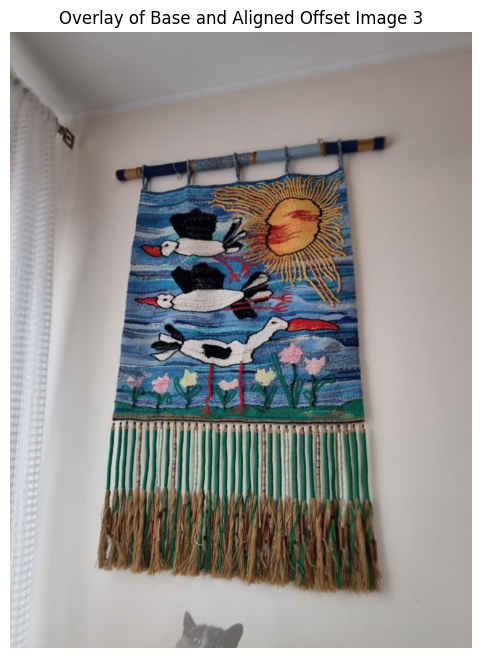

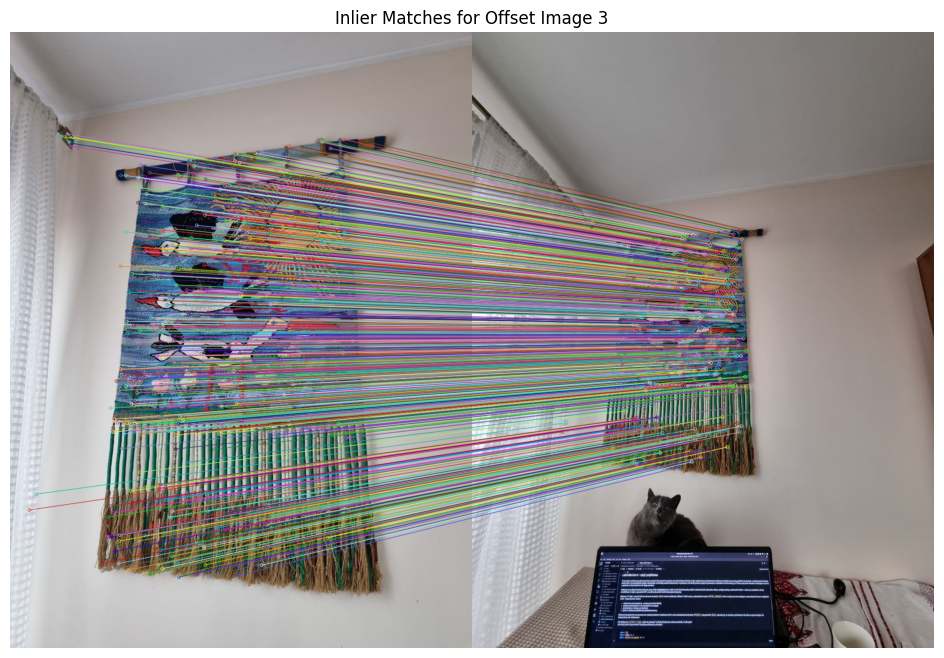

In [22]:
for i, offset_img in enumerate(offset_images):
    aligned_img, kp_offset, filtered_matches, mask= process_offset_image(offset_img, base, kp_base, des_base)

    # Visualize alignment result
    f, axes = plt.subplots(1, 3, figsize=(20, 8))
    axes[0].imshow(base[..., ::-1])
    axes[0].set_title("Base Image")
    axes[0].axis('off')

    axes[1].imshow(aligned_img[..., ::-1])
    axes[1].set_title(f"Aligned Offset Image {i}")
    axes[1].axis('off')
    
    axes[2].imshow(offset_img[..., ::-1])
    axes[2].set_title(f"Original Offset Image {i}")
    axes[2].axis('off')

    plt.show()

    # Overlay images to check alignment
    overlay = cv2.addWeighted(base, 0.5, aligned_img, 0.5, 0)
    plt.figure(figsize=(8, 8))
    plt.imshow(overlay[..., ::-1])
    plt.title(f"Overlay of Base and Aligned Offset Image {i}")
    plt.axis('off')
    plt.show()

    # Visualize matched points and inliers
    matches_mask = mask.ravel().tolist()
    inlier_image = cv2.drawMatches(base, kp_base, offset_img, kp_offset, filtered_matches, None,
                                   matchesMask=matches_mask, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(16, 8))
    plt.imshow(inlier_image[..., ::-1])
    plt.title(f"Inlier Matches for Offset Image {i}")
    plt.axis('off')
    plt.show()